In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from tqdm import tqdm
import pandas as pd
import pickle
import phate
import scipy
import matplotlib.pyplot as plt
import scipy.io as sio
from sklearn.decomposition import PCA
from numpy import savetxt
import plotly.graph_objs as go
import scprep
import skdim
import tensorflow as tf
from sklearn.model_selection import train_test_split
import random

2024-04-08 17:09:18.813932: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-08 17:09:19.024873: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /cvmfs/ai.mila.quebec/apps/arch/distro/OpenSSL/1.1/lib:/cvmfs/ai.mila.quebec/apps/arch/distro/libreadline/7.0/lib:/cvmfs/ai.mila.quebec/apps/arch/distro/libffi/3.2.1/lib
2024-04-08 17:09:19.024916: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-04-08 17:09:20.406466: W tensorflow/compiler/xla/st

### Curvature computation

In [2]:
def find_basis(point_cloud, x,  extrin_dim = 3, epsilon_PCA = 0.1, tau_radius = 0.4):
    #point_cloud: the manifold 
    #x: np.array of shape 1 by p, the point where the curvature is evaluated at, e.g., [[1, 2, 3]]
    #epsilon: the radius of local PCA
    #dim: the dimension of the manifold
    #tau_ratio: the ratio is tau radius (where we evaluate the curvature)/ epsilon_sqrt
    
    # Find transport neighborhood
    k = int(0.05 * point_cloud.shape[0])

    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(point_cloud)
    ep_dist, ep_idx = nbrs.radius_neighbors(x, epsilon_PCA, return_distance=True, sort_results = True)
    
    tau_dist, tau_idx = nbrs.radius_neighbors(x, tau_radius, return_distance=True, sort_results = True)
    
    tau_nbrs = point_cloud[tau_idx[0]]
    
    
    pca_nbrs = point_cloud[ep_idx[0]]
    Xi = pca_nbrs - x
    Di = np.diag(np.sqrt(np.exp(- np.array(ep_dist[0]) ** 2 / epsilon_PCA)))
    Bi = Xi.T @ Di
    
    U, S, VT = np.linalg.svd(Bi.T, full_matrices = False)
    O = VT[:extrin_dim, :]
    
    
    return tau_nbrs, O

In [3]:
def compute_Gaussian_curvature(point_cloud, query_point, extrin_dim = 3, 
                               epsilon_PCA = 0.1, tau_radius = 0.4, max_min_num = 10, use_cross = True):
    
    tau_nbrs, O = find_basis(point_cloud, query_point, extrin_dim = extrin_dim,
                             epsilon_PCA = epsilon_PCA, tau_radius = tau_radius)
            
    if use_cross:
        O2 = np.cross(O[0], O[1])
    else:
        O2 = O[2]

    ti = tau_nbrs[1:] - tau_nbrs[0]
    norms = np.square(ti).sum(axis=1)
    tensor_all = 2 * (O2 * ti).sum(axis=1) / norms

    if max_min_num < 1:
        #min_quantile = max_min_num
        #max_cur = np.quantile(tensor_all, 1-min_quantile)
        #min_cur = np.quantile(tensor_all, min_quantile)
        top_bottom_count = int(len(tensor_all) * max_min_num)
        sorted_cur = np.sort(tensor_all)
        max_cur = sorted_cur[-top_bottom_count:]
        min_cur = sorted_cur[:top_bottom_count]
    else:
        max_cur = sum(sorted(tensor_all, reverse=True)[:max_min_num])/max_min_num    
        min_cur = sum(sorted(tensor_all)[:max_min_num])/max_min_num
    
    return max_cur * min_cur
 

In [4]:
def compute_mean_curvature(point_cloud, query_point, center, extrin_dim = 3,
                           epsilon_PCA = 0.1, tau_radius = 0.4, max_min_num = 10, use_cross = True):
    
    tau_nbrs, O = find_basis(point_cloud, query_point, extrin_dim = extrin_dim,
                             epsilon_PCA = epsilon_PCA, tau_radius = tau_radius)
    
    if use_cross:
        O2 = np.cross(O[0], O[1])
    else:
        O2 = O[2]
        
    if np.dot(query_point[0] - center, O2) < 0:
        O2 = -O2
    

    ti = tau_nbrs[1:] - tau_nbrs[0]
    norms = np.square(ti).sum(axis=1)
    tensor_all = 2 * (O2 * ti).sum(axis=1) / norms

    if max_min_num < 1:
        #min_quantile = max_min_num
        #max_cur = np.quantile(tensor_all, 1-min_quantile)
        #min_cur = np.quantile(tensor_all, min_quantile)
        top_bottom_count = int(len(tensor_all) * max_min_num)
        sorted_cur = np.sort(tensor_all)
        max_cur = sorted_cur[-top_bottom_count:]
        min_cur = sorted_cur[:top_bottom_count]
        
    else:
        max_cur = sum(sorted(tensor_all, reverse=True)[:max_min_num])/max_min_num    
        min_cur = sum(sorted(tensor_all)[:max_min_num])/max_min_num
    
    return (max_cur + min_cur)/2
 

## Data

In [5]:
def generate_ellipsoid_cloud(a, b, c, num_points = 5000):
    """Generate a random point on an ellipsoid defined by a,b,c"""
    
    theta = np.random.uniform(0, 2*np.pi, num_points)
    v = np.random.rand(num_points)
    phi = np.arccos(2.0 * v - 1.0)
    sinTheta = np.sin(theta);
    cosTheta = np.cos(theta);
    sinPhi = np.sin(phi);
    cosPhi = np.cos(phi);
    rx = a * sinPhi * cosTheta;
    ry = b * sinPhi * sinTheta;
    rz = c * cosPhi;
    return np.column_stack((rx, ry, rz))

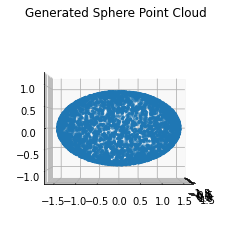

In [6]:
ellipsoid = generate_ellipsoid_cloud(0.9, 1.5, 0.9)

# Visualize the point cloud
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ellipsoid[:, 0], ellipsoid[:, 1], ellipsoid[:, 2], s=5)
ax.set_aspect('equal')
ax.set_title("Generated Sphere Point Cloud")
ax.view_init(0, 0)
plt.show()

## Gaussian Curvature 

In [7]:
num_eval = int(len(ellipsoid))
curvature = []
for i in tqdm(range(num_eval)):
    b = compute_Gaussian_curvature(ellipsoid, ellipsoid[i].reshape(1, -1), 
                                    epsilon_PCA =0.2, tau_radius = 0.6, max_min_num = 300)
    curvature.append(b)

100%|██████████| 5000/5000 [00:13<00:00, 380.01it/s]


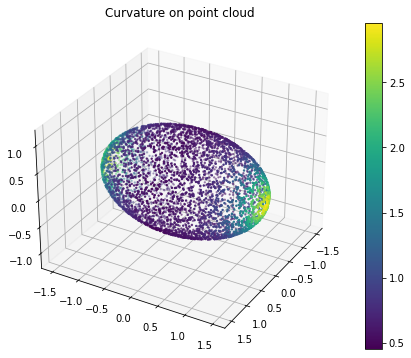

In [8]:
v = np.array(curvature).T
# Visualize the point cloud
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(ellipsoid[:num_eval, 0], ellipsoid[:num_eval, 1], ellipsoid[:num_eval, 2], s=2, c = v)
ax.set_title("Curvature on point cloud")
ax.view_init(30, 30)
plt.colorbar(scatter)
ax.set_aspect('equal')
plt.show()

In [9]:
def ellipsoid_ground_truth(point_cloud, a, b, c):
    #point_cloud: N by 3 array
    cur = []
    for p in point_cloud:
        k = 1 / (a **2 * b**2 * c**2 * (p[0]**2 / a**4 + p[1]**2 / b**4 + p[2]**2 / c**4) **2)
        cur.append(k)
    return cur

In [10]:
dd= np.array(ellipsoid_ground_truth(ellipsoid, 0.9, 1.5, 0.9))
from scipy.stats import pearsonr
corr, _ = pearsonr(dd, v)
corr

0.9933044361855297

## Phate embedding

In [11]:
phate_operator = phate.PHATE(n_components = 2)

ellip2d = phate_operator.fit_transform(ellipsoid)

Calculating PHATE...
  Running PHATE on 5000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.05 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 0.10 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.47 seconds.
    Calculating KMeans...
    Calculated KMeans in 5.38 seconds.
  Calculated landmark operator in 6.81 seconds.
  Calculating optimal t...
    Automatically selected t = 50
  Calculated optimal t in 1.10 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.35 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.41 seconds.
Calculated PHATE in 13.78 seconds.


<AxesSubplot: xlabel='PHATE1', ylabel='PHATE2'>

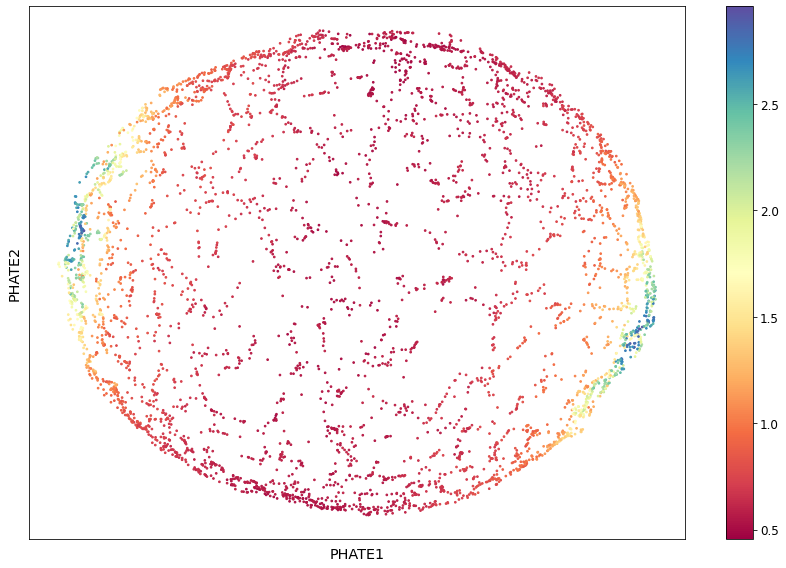

In [12]:
scprep.plot.scatter2d(ellip2d, c=v, figsize=(12,8), cmap="Spectral",
                      ticks=False, label_prefix="PHATE")

## Curvature potential

In [13]:
v

array([0.61259123, 0.74234778, 0.91896559, ..., 0.8059373 , 0.62230516,
       1.06349635])

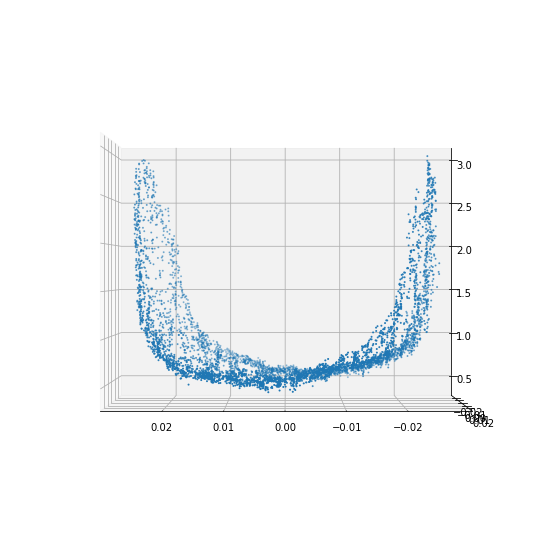

In [14]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')

scatter = ax.scatter(ellip2d[:,0], ellip2d[:,1], v[:], s=1)
ax.view_init(0, 90)


In [15]:
cur_pot = np.concatenate([ellip2d, v.reshape(-1,1)], axis =1)

In [16]:
cur_pot

array([[ 1.67446344e-02,  1.92414109e-02,  6.12591230e-01],
       [-1.42186476e-02,  1.12253058e-02,  7.42347778e-01],
       [-1.37308787e-02,  1.94921272e-02,  9.18965585e-01],
       ...,
       [-1.16191188e-02,  1.50617342e-02,  8.05937296e-01],
       [-3.63499873e-03,  2.50200444e-02,  6.22305165e-01],
       [ 2.24477354e-02,  2.86045738e-04,  1.06349635e+00]])

In [17]:
scprep.plot.rotate_scatter3d(cur_pot, figsize=(8,6), cmap="Spectral",
                             ticks=False, filename="output/curvature_potential.gif")

MovieWriter imagemagick unavailable; using Pillow instead.


## Use GAE to reconstruct 

In [18]:
import torch
import sys
#sys.path.append("output/")

from models.vae import VAE
from models.train import train_vae

from torch.utils.data import DataLoader, TensorDataset
from models.jacobian import compute_jacobian
from models.visualize import visualize_jacobian_at_z0, visualize_jacobian_plane_at_z0, visualize_jacobian_plane_at_z0_schmidt

In [19]:
ptt_tensor = torch.from_numpy(cur_pot).float()

ptt_dataset = TensorDataset(ptt_tensor)
ptt_dataloader = DataLoader(ptt_dataset, batch_size=1024, shuffle=False)

100%|██████████| 100/100 [00:03<00:00, 28.29it/s]


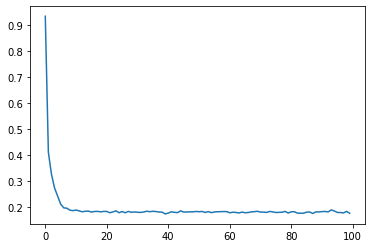

In [20]:
# Initialize the VAE with input_dim=5 and latent_dim=2
vae = VAE(input_dim=3, latent_dim=2, hidden_dim=64, activation="leaky_relu")

# Train the VAE
loss = train_vae(vae, ptt_dataloader, epochs=100, learning_rate=1e-2, beta=0.2)
plt.plot(loss)

In [21]:
# Pass the hemisphere data through the VAE to get the reconstructed data
with torch.no_grad():
    reconstructed, mu, logvar = vae(ptt_tensor)
    reconstr_mean = vae.decoder(mu)

# Convert the reconstructed data to numpy for visualization
reconstructed_data = reconstructed.numpy()
latent_mu = mu
latent_mu_data = mu.numpy()
latent_logvar = logvar.numpy()
reconstr_mean = reconstr_mean.numpy()
reconstructed_data.shape

(5000, 3)

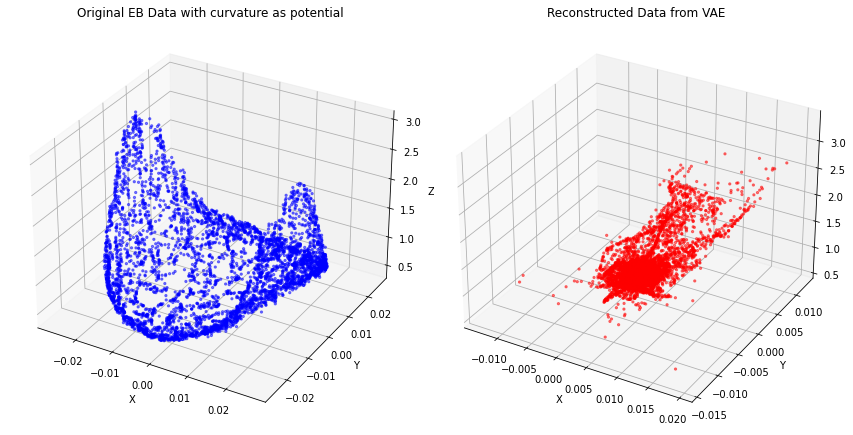

In [22]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12, 6))

# Plot original data
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(ptt_tensor[:, 0], ptt_tensor[:, 1], ptt_tensor[:, 2], c='b', s = 5, alpha=0.5)
ax1.set_title("Original EB Data with curvature as potential")
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')
#ax1.set_xlim([-1, 1])
#ax1.set_ylim([-1, 1])
#ax1.set_zlim([0, 1])

# Plot reconstructed data
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(reconstructed_data[:, 0], reconstructed_data[:, 1], reconstructed_data[:, 2], c='r', s = 5, alpha=0.5)
ax2.set_title("Reconstructed Data from VAE")
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')
#ax2.set_xlim([-1, 1])
#ax2.set_ylim([-1, 1])
#ax2.set_zlim([0, 1])

plt.tight_layout()
plt.show()


## Use network parameterize

### In 2D

2024-01-24 10:53:30.097471: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory
2024-01-24 10:53:30.098203: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusparse.so.11'; dlerror: libcusparse.so.11: cannot open shared object file: No such file or directory
2024-01-24 10:53:30.098259: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1934] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2024-01-24 10:53:30.103417: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized wit

32/32 [==============================] - 0s 914us/step - loss: 2.5525e-06
Mean Squared Error on Test Set: 2.5525303044560133e-06
157/157 [==============================] - 0s 2ms/step


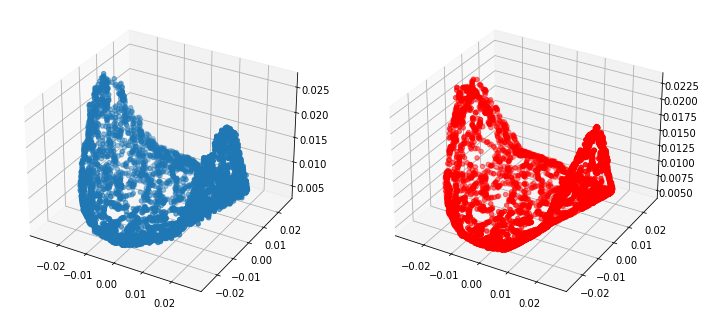

In [23]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Generate some sample data
np.random.seed(42)
num_samples = 1000
x = ellip2d
factor = max([max(x[:, 0]), max(x[:, 1])])
y = v/ max(v) * factor 



# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Build a simple neural network model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(2,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, epochs=50, batch_size=32, validation_data=(x_test, y_test), verbose=0)

# Evaluate the model on the test set
loss = model.evaluate(x_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')

# Use the trained model to predict flow on a new set of points
new_points = x
predicted = model.predict(new_points)

# Visualize the predicted flow
# Visualize the surface
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(x[:, 0], x[:, 1], y)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(new_points[:, 0], new_points[:, 1], predicted, color='r', label='Predicted')
plt.show()


In [5]:
# Function to compute the gradient using the model
def compute_gradient(model, points):
    points = tf.convert_to_tensor(points, dtype=tf.float32)  # Convert to a tf.Tensor
    with tf.GradientTape() as tape:
        tape.watch(points)
        prediction = model(points)
    gradient = tape.gradient(prediction, points)
    return gradient.numpy()

157/157 [==============================] - 0s 1ms/step


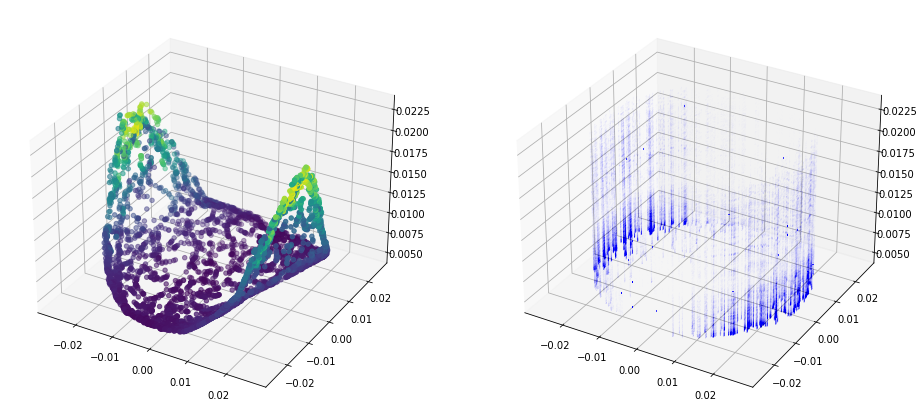

In [25]:
test_points = new_points[:500]
predicted = model.predict(new_points)
grad = compute_gradient(model, test_points)
# Visualize the predicted flow and gradient
fig = plt.figure(figsize=(16, 8))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(new_points[:, 0], new_points[:, 1], predicted, c = v, label='Predicted Flow')
x_lim = ax.get_xlim()
y_lim = ax.get_ylim()
z_lim = ax.get_zlim()

# Plotting the gradient arrows
ax = fig.add_subplot(122, projection='3d')
ax.quiver(test_points[:, 0], test_points[:, 1], predicted[:500], -0.01 * grad[:, 0], 
          -0.01 * grad[:, 1], -0.01 * predicted[:500], color='b', length=0.0001, normalize=False)
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_zlim(z_lim)    



plt.show()

In [26]:
new_points[:, 0].shape

(5000,)

## In 3D

In [ ]:


# Generate some sample data
np.random.seed(42)
num_samples = 1000
x = ellipsoid
factor = max([max(x[:, 0]), max(x[:, 1]), max(x[:, 1])])
y = v/ max(v) * factor 



# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Build a simple neural network model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(3,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, epochs=200, batch_size=32, validation_data=(x_test, y_test), verbose=0)

# Evaluate the model on the test set
loss = model.evaluate(x_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')

# Use the trained model to predict flow on a new set of points
new_points = x
predicted = model.predict(new_points)




In [ ]:
# Visualize the predicted flow
# Visualize the surface
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(x[:, 0], x[:, 1], x[:, 2], c = y)
ax.view_init(30, 30)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(new_points[:, 0], new_points[:, 1], new_points[:, 2], c=predicted, label='Predicted')
ax.view_init(30, 30)
plt.show()

In [ ]:
test_points = new_points[:500]
grad = compute_gradient(model, test_points)

In [ ]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize
colors = v[:500]
norm = Normalize()
norm.autoscale(colors)
colormap = cm.inferno

colors=colormap(norm(colors))

In [ ]:
# Visualize the predicted flow and gradient
fig = plt.figure(figsize=(16, 8))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(new_points[:, 0], new_points[:, 1], new_points[:, 2], c = v, s = 5, label='Predicted Flow')
x_lim = ax.get_xlim()
y_lim = ax.get_ylim()
z_lim = ax.get_zlim()
ax.view_init(0, 0)

# Plotting the gradient arrows
ax = fig.add_subplot(122, projection='3d')
ax.quiver(test_points[:, 0], test_points[:, 1], test_points[:, 2], -0.5 * grad[:, 0], 
          -0.5 * grad[:, 1], -0.5 * grad[:, 2], color = colors, length=0.2, normalize=True)

ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_zlim(z_lim)
ax.view_init(0, 0)

plt.show()

## On torus

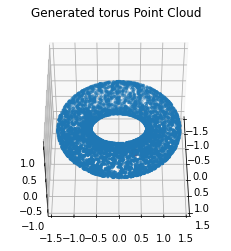

In [7]:
def generate_torus_point_cloud(num_points = 5000, R = 3, r = 1):
    # Generate random angles for theta and phi
    theta = np.random.uniform(0, 2*np.pi, num_points)
    phi = np.random.uniform(0, 2*np.pi, num_points)

    # Compute the torus points
    x = (R + r * np.cos(phi)) * np.cos(theta)
    y = (R + r * np.cos(phi)) * np.sin(theta)
    z = r * np.sin(phi)
    
    x_c = R * np.cos(theta)
    y_c = R * np.sin(theta)
    z_c = np.zeros(x.shape)
    
    

    return np.column_stack((x, y, z)), np.column_stack((x_c, y_c, z_c))

# Create torus parameters
R = 1 # Major radius
r = 0.375  # Minor radius
num_samples = 5000



# Generate a torus point cloud with 1000 points and radius 1
torus, torus_centers = generate_torus_point_cloud(num_points = num_samples, R = R, r = r)

# Visualize the point cloud
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(torus[:, 0], torus[:, 1], torus[:, 2], s=5)
ax.scatter(torus[0, 0], torus[0, 1], torus[0, 2], s=50, c = 'r')
#ax.scatter(torus_centers[:, 0], torus_centers[:, 1], torus_centers[:, 2], s=5, c = 'r')
ax.set_aspect('equal')
ax.set_title("Generated torus Point Cloud")
ax.view_init(45, 0)
plt.show()

In [8]:
num_eval = int(len(torus))
curvature = []
for i in tqdm(range(num_eval)):
    b = compute_Gaussian_curvature(torus, torus[i].reshape(1, -1), 
                                   epsilon_PCA =0.2, tau_radius = 1, max_min_num = 300)
    curvature.append(b)

100%|██████████| 5000/5000 [00:16<00:00, 294.19it/s]


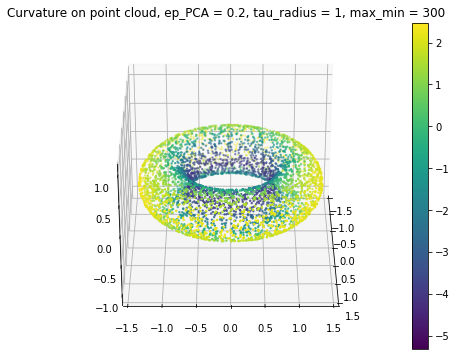

In [9]:
v = np.array(curvature).T
# Visualize the point cloud

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(torus[:num_eval, 0], torus[:num_eval, 1], torus[:num_eval, 2], s=2, c = v)
ax.set_title("Curvature on point cloud, ep_PCA = 0.2, tau_radius = 1, max_min = 300")
ax.view_init(30, 0)
plt.colorbar(scatter)
ax.set_aspect('equal')
plt.show()

In [10]:
# Generate some sample data
np.random.seed(42)
num_samples = 1000
x = torus
factor = max([max(x[:, 0]), max(x[:, 1]), max(x[:, 1])])
y = v/ max(v) * factor 



# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Build a simple neural network model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(3,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, epochs=200, batch_size=32, validation_data=(x_test, y_test), verbose=0)

# Evaluate the model on the test set
loss = model.evaluate(x_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')

# Use the trained model to predict flow on a new set of points
new_points = x
predicted = model.predict(new_points)


2024-01-24 11:55:32.634919: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-01-24 11:55:32.635338: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2024-01-24 11:55:32.635580: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2024-01-24 11:55:32.637363: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory
2024-01-24 11:55:32.637414: W te

32/32 [==============================] - 0s 1ms/step - loss: 0.0054
Mean Squared Error on Test Set: 0.005389366764575243
157/157 [==============================] - 0s 949us/step


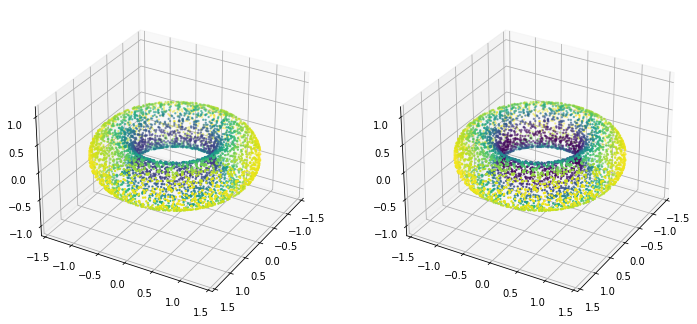

In [11]:
# Visualize the predicted flow
# Visualize the surface
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(x[:, 0], x[:, 1], x[:, 2], c = y, s = 2)
ax.set_aspect('equal')
ax.view_init(30, 30)


ax = fig.add_subplot(122, projection='3d')
ax.scatter(new_points[:, 0], new_points[:, 1], new_points[:, 2], c=predicted, s = 2)
ax.set_aspect('equal')
ax.view_init(30, 30)

plt.show()

In [12]:
num = 250

In [15]:
test_points = new_points[:num]
grad = compute_gradient(model, test_points)

In [16]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize
colors = v[:num]
norm = Normalize()
norm.autoscale(colors)
colormap = cm.inferno

colors=colormap(norm(colors) + 0.1)
#colors=colormap(colors)

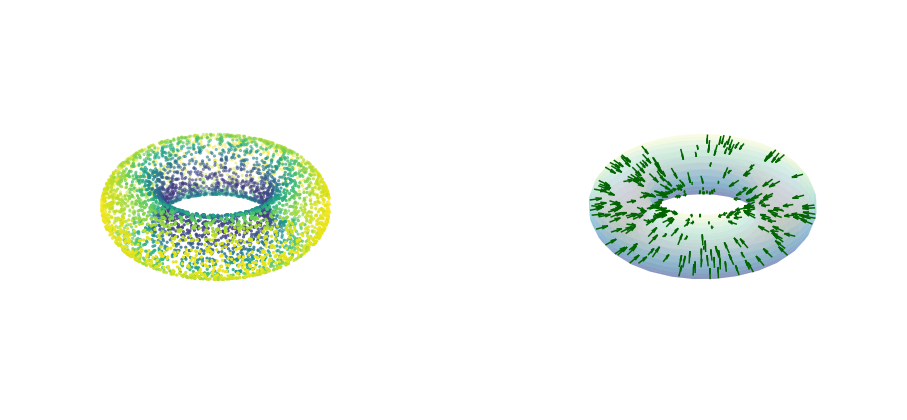

In [17]:
# Visualize the predicted flow and gradient
fig = plt.figure(figsize=(16, 8))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(new_points[:, 0], new_points[:, 1], new_points[:, 2], c = v, s = 5, label='Predicted Flow')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.set_aspect('equal')
ax.view_init(30, 30)
plt.axis('off')

# Plotting the gradient arrows
ax = fig.add_subplot(122, projection='3d')
#ax.scatter(test_points[:, 0], test_points[:, 1], test_points[:, 2], c = v[:500], s = 20, label='Predicted Flow')
ax.quiver(test_points[:, 0], test_points[:, 1], test_points[:, 2], -0.5 * grad[:, 0], -0.5 * grad[:, 1], 
          -0.5 * grad[:, 2], color = 'darkgreen', length=0.15, normalize=True, arrow_length_ratio=0.5)

R, r = 1, 0.375
u, w = np.mgrid[0:2 * np.pi:30j, 0: 2*np.pi:30j]
x = (R + r * np.cos(w)) * np.cos(u)
y = (R + r * np.cos(w)) * np.sin(u)
z = r * np.sin(w)
ax.plot_surface(x, y, z, cmap=plt.cm.YlGnBu_r, alpha=0.3)
ax.set_aspect('equal')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(30, 30)
plt.axis('off')

plt.show()

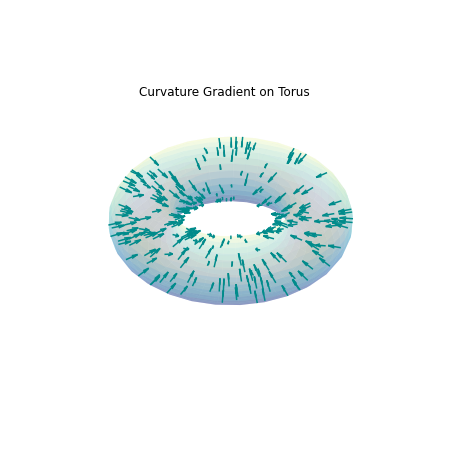

In [18]:
# Visualize the predicted flow and gradient
fig = plt.figure(figsize=(8, 8))

ax = fig.add_subplot(111, projection='3d')
#ax.scatter(test_points[:, 0], test_points[:, 1], test_points[:, 2], c = v[:500], s = 20, label='Predicted Flow')
ax.quiver(test_points[:, 0], test_points[:, 1], test_points[:, 2], -0.5 * grad[:, 0], -0.5 * grad[:, 1], 
          -0.5 * grad[:, 2], color = 'darkcyan', length=0.15, normalize=True, arrow_length_ratio=0.5)

R, r = 1, 0.375
u, w = np.mgrid[0:2 * np.pi:30j, 0: 2*np.pi:30j]
x = (R + r * np.cos(w)) * np.cos(u)
y = (R + r * np.cos(w)) * np.sin(u)
z = r * np.sin(w)
ax.plot_surface(x, y, z, cmap=plt.cm.YlGnBu_r, alpha=0.3)
ax.set_aspect('equal')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(35, 20)
ax.set_title("Curvature Gradient on Torus", y= 0.9, pad=-14)
plt.axis('off')
plt.savefig('curvature_grad.png', dpi=300)

plt.show()


## iPSC data

In [5]:
X = sio.loadmat('data/ipscData.mat')['data']
X.shape

(220450, 33)

In [ ]:
phate_operator = phate.PHATE(n_components = 3)

Y_phate3d = phate_operator.fit_transform(X)

Calculating PHATE...
  Running PHATE on 220450 observations and 33 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...


In [7]:
n_obs=10000
nontrain = list(np.arange(X.shape[0]))
testind = random.sample(nontrain,n_obs)

In [8]:
len(testind)

10000

In [9]:
def make_ipsc(X, n_obs=150,emb_dim=3,knn=5,indx=None):
    
    #load data
    #initdir = os.getcwd()
    #os.chdir(os.path.abspath('..') + '/src/data')
    #X = sio.loadmat('ipscData.mat')['data']
    #os.chdir(initdir)
    ipsc_data = X[indx,:].squeeze()
    
    phate_operator = phate.PHATE(random_state=42, verbose=False, n_components=emb_dim, knn=knn,t=250,decay=10)
    ipsc_phate = phate_operator.fit_transform(ipsc_data) #only compute on 100 points since it's so expensive for > 6000
    ipsc_phate = scipy.stats.zscore(ipsc_phate) 
    
    return ipsc_phate

In [10]:
ipsc = make_ipsc(X, n_obs=n_obs,emb_dim=3,knn=5,indx=testind)

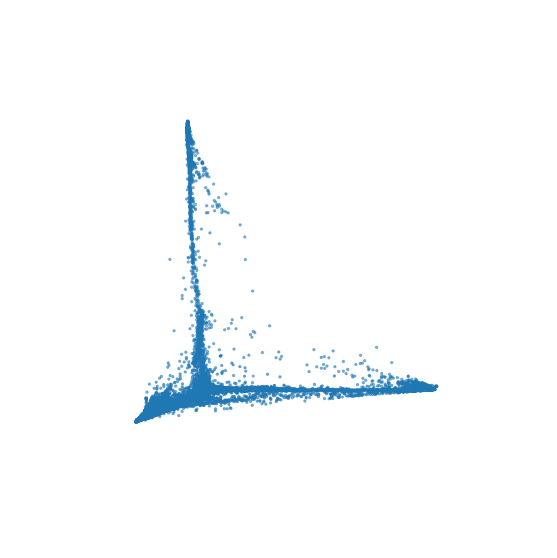

In [9]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')

ax.scatter(ipsc[:,0], ipsc[:,1], ipsc[:,2], s=5)
ax.view_init(-90, 0)
plt.axis('off')
plt.savefig('ipsc_data.png')
plt.show()

In [12]:
savetxt('output/ipsc.csv', ipsc, delimiter=',')

In [5]:
ipsc = np.loadtxt('output/ipsc.csv', delimiter=',')

In [33]:
trace1 = go.Scatter3d(dict(zip(['x', 'y', 'z'], ipsc.T[:3])),
                     mode='markers', marker=dict(size=1.5, colorbar=dict()))

layout = go.Layout(scene=dict(aspectmode="cube", 
                              xaxis=dict(showgrid=True, showticklabels=False, title=''),
                              yaxis=dict(showgrid=True, showticklabels=False, title=''),
                              zaxis=dict(showgrid=True, showticklabels=False, title='')))

fig = go.Figure(data=[trace1], layout=layout)

# Compute local intrinsic dimensions using lPCA
pca = skdim.id.lPCA()
lid1 = pca.fit_pw(ipsc, n_neighbors=10).dimension_pw_
lid1 = np.clip(lid1, a_max=2, a_min=None)

# Update the trace properties
fig.update_traces({'text': lid1, 'marker.color': lid1, 'marker.colorbar': dict(thickness=5, x=.80)}, selector=dict(type='scatter3d'))

# Save the figure as an HTML file
fig.write_html("ipsc_dim_plot.html")

In [ ]:
num_eval = int(len(ipsc))
curvature = []
for i in tqdm(range(num_eval)):
    b = compute_Gaussian_curvature(ipsc, ipsc[i].reshape(1, -1), 
                                   epsilon_PCA =0.7, tau_radius = 1.5, max_min_num = 0.4)
    curvature.append(b)

 13%|█▎        | 3991/30000 [06:34<1:01:13,  7.08it/s]

In [ ]:
np.save('ipsc_curvature_5.npy', np.array(curvature).T)
v = np.array(curvature).T

In [15]:
use_existing = True
if use_existing:
    v = np.load('ipsc_curvature_1.npy')

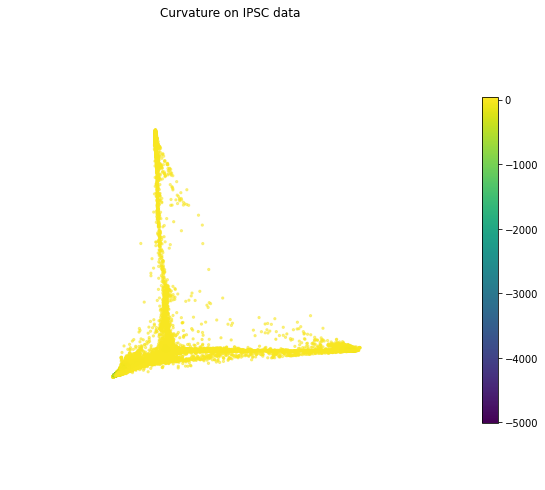

In [20]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')

# Scatter plot
scatter = ax.scatter(ipsc[:,0], ipsc[:,1], ipsc[:,2], s=5, c=v)

# Add colorbar with shrink parameter
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6)  # Adjust the shrink value as needed

# Add label to the colorbar
#cbar.set_label('Color Label')

# Set plot title
ax.set_title("Curvature on IPSC data", pad=20)

# Rotate the view
ax.view_init(-90, 0)
plt.axis('off')
#plt.savefig('cur_ipsc.png')
plt.show()


In [ ]:
plt.plot(sorted(v))

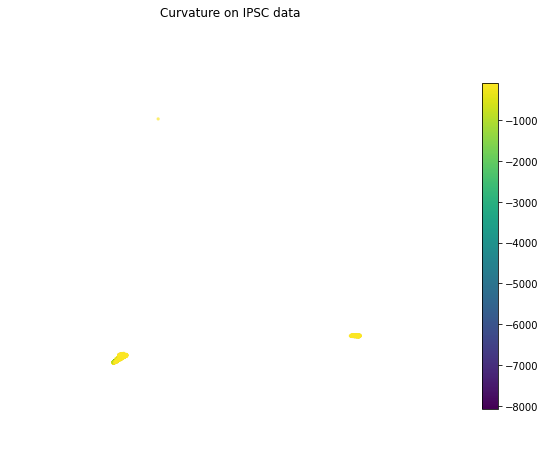

In [16]:
indices = np.argsort(v)
sorted_ipsc = ipsc[indices][:10000]

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')

# Scatter plot
scatter = ax.scatter(sorted_ipsc[:,0], sorted_ipsc[:,1], sorted_ipsc[:,2], s=5, c=sorted(v)[:10000])

# Add colorbar with shrink parameter
cbar = fig.colorbar(scatter, ax=ax, shrink=0.6)  # Adjust the shrink value as needed

# Add label to the colorbar
#cbar.set_label('Color Label')

# Set plot title
ax.set_title("Curvature on IPSC data")

# Rotate the view
ax.view_init(-90, 0)
plt.axis('off')
plt.show()


In [26]:
trace1 = go.Scatter3d(dict(zip(['x', 'y', 'z'], ipsc.T[:3])),
                     mode='markers', marker=dict(size=1.5, colorbar=dict()))

layout = go.Layout(scene=dict(aspectmode="cube", 
                              xaxis=dict(showgrid=True, showticklabels=False, title=''),
                              yaxis=dict(showgrid=True, showticklabels=False, title=''),
                              zaxis=dict(showgrid=True, showticklabels=False, title='')))

fig = go.Figure(data=[trace1], layout=layout)

# Update the trace properties
fig.update_traces({'text': v, 'marker.color': v, 'marker.colorbar': dict(thickness=5, x=.80)}, selector=dict(type='scatter3d'))

# Save the figure as an HTML file
fig.write_html("ipsc_cur_plot.html")
